# Variational Autoencoder

# Exercise

Are you able to create training animations for the manifold and latent space plots?

In [1]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision import datasets
import numpy as np
from pathlib import Path
import os
import imageio.v2 as imageio
from IPython.display import Image

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
batch_size, image_dim = 256, 784
emb_dim, enc_hidden_units = 2, 512
dec_hidden_units, dec_hidden_units2 = 256, 512

In [3]:
train_set = torchvision.datasets.MNIST(
    root= './data/MNIST',
    train= True,
    download= True,
    transform= transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.view(image_dim))
    ])
)

train_loader = torch.utils.data.DataLoader(
    train_set, batch_size = batch_size
)

valid_set = torchvision.datasets.MNIST(
    root= './data/MNIST',
    train= False,
    download= True,
    transform= transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.view(image_dim))
    ])
)

valid_loader = torch.utils.data.DataLoader(
    valid_set, batch_size = batch_size
)

100%|██████████| 9912422/9912422 [00:00<00:00, 79000574.31it/s]


Extracting ./data/MNIST/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 72536343.61it/s]


Extracting ./data/MNIST/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 26069371.39it/s]


Extracting ./data/MNIST/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 11602027.26it/s]

Extracting ./data/MNIST/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/MNIST/raw



In [4]:
class Encoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super().__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, output_dim)
        self.fc3 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        out = self.fc1(x)
        out = F.relu(out)
        mu = self.fc2(out)
        log_sigma = self.fc3(out)
        return mu, log_sigma

class Decoder(nn.Module):
    def __init__(self, output_dim, hidden_dim, hidden_dim2, input_dim):
        super().__init__()
        self.fc1 = nn.Linear(output_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim2)
        self.fc3 = nn.Linear(hidden_dim2, input_dim)

    def forward(self, x):
        out = self.fc1(x)
        out = F.relu(out)
        out = self.fc2(out)
        out = F.relu(out)
        out = self.fc3(out)
        out = out.sigmoid()
        return out
    
def sampling(mu, log_sigma):
    eps = torch.randn(mu.shape[0], mu.shape[1])
    return mu + torch.exp(log_sigma / 2) * eps

class VAE(nn.Module):
        def __init__(self, enc, dec):
            super().__init__()
            self.enc = enc
            self.dec = dec

        def forward(self, x):
            mu, log_sigma = model.enc(inp)
            z = sampling(mu, log_sigma)
            out = model.dec(z)
            return out, z[0], z[1]

In [5]:
# Creating a manifold of samples

# Setting number of samples (18*18) and size of images in manifold as default
def manifold(model, it='', n=18, size=28): 
    result = torch.zeros((size * n, size * n))

    # Defyining grid space
    s, s2 = torch.linspace(-7, 7, n), torch.linspace(7, -7, n)
    grid_x, grid_y = torch.std(s)*s, torch.std(s2)*s2 

    for i, y_ex in enumerate(grid_x):
        for j, x_ex in enumerate(grid_y):
            z_sample = torch.repeat_interleave(torch.tensor([[x_ex, y_ex]]), 
                                               repeats=batch_size, dim=0)
            x_dec = model.dec(z_sample)
            element = x_dec[0].reshape(size, size).detach()
            result[i * size: (i + 1) * size, j * size: (j + 1) * size] = element

    plt.figure(figsize=(12, 12))
    plt.title("VAE Samples", fontsize=20)
    plt.xlabel("X", fontsize=18)
    plt.ylabel("Y", fontsize=18)
    plt.imshow(result, cmap='Greys')
    Path("animations/vae_samples").mkdir(parents=True, exist_ok=True)
    plt.savefig('animations/vae_samples/VAE'+str(it)+'.png', format='png', dpi=300)
    plt.close()  

In [6]:
def latent_space(model, train_set, it=''):
    x_latent = model.enc(train_set.data.reshape(-1, 28*28).float())
    plt.figure(figsize=(10, 7))
    plt.scatter(x_latent[0][:,0].detach().numpy(), x_latent[1][:,1].detach().numpy(), c=train_set.targets)
    plt.colorbar()
    plt.title("VAE Latent Space", fontsize=20)
    plt.xlabel("X", fontsize=18)
    plt.ylabel("Y", fontsize=18)
    Path("animations/latent_space").mkdir(parents=True, exist_ok=True)
    plt.savefig('animations/latent_space/VAE_space'+str(it)+'.png', format='png', dpi=200)
    plt.close()

In [7]:
epochs = 8
dataloaders = {'train': train_loader, 'val': valid_loader}
enc = Encoder(image_dim, enc_hidden_units, emb_dim)
dec = Decoder(emb_dim, dec_hidden_units, dec_hidden_units2, image_dim)
model = VAE(enc, dec).to(device)
optimizer = optim.SGD(model.parameters(), lr=1e-3)

for epoch in range(epochs):
    for phase in ['train', 'val']:
        losses = []
        
        if phase == 'train':
            model.train()
        else:
            model.eval()
        
        for i, (inp, _) in enumerate(dataloaders[phase]):
            out, z_mu, z_var = model(inp)
            rec = F.binary_cross_entropy(out, inp, reduction='sum') / inp.shape[0]
            kl = -0.5*torch.mean(1+z_var-z_mu.pow(2)-torch.exp(z_mu))
            loss = rec + kl
            losses.append(loss.item())
        
            if phase == 'train':
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

        manifold(model, str(epoch))
        latent_space(model, train_set, str(epoch))

In [8]:
def create_gif(png_dir):
    images = []
    for file_name in sorted(os.listdir(png_dir)):
        if file_name.endswith('.png'):
            file_path = os.path.join(png_dir, file_name)
            images.append(imageio.imread(file_path))

    output = png_dir.split('/')[1] + '.gif'
    imageio.mimsave(output, images)
    display(Image(data=open(output, 'rb').read(), format='gif'))

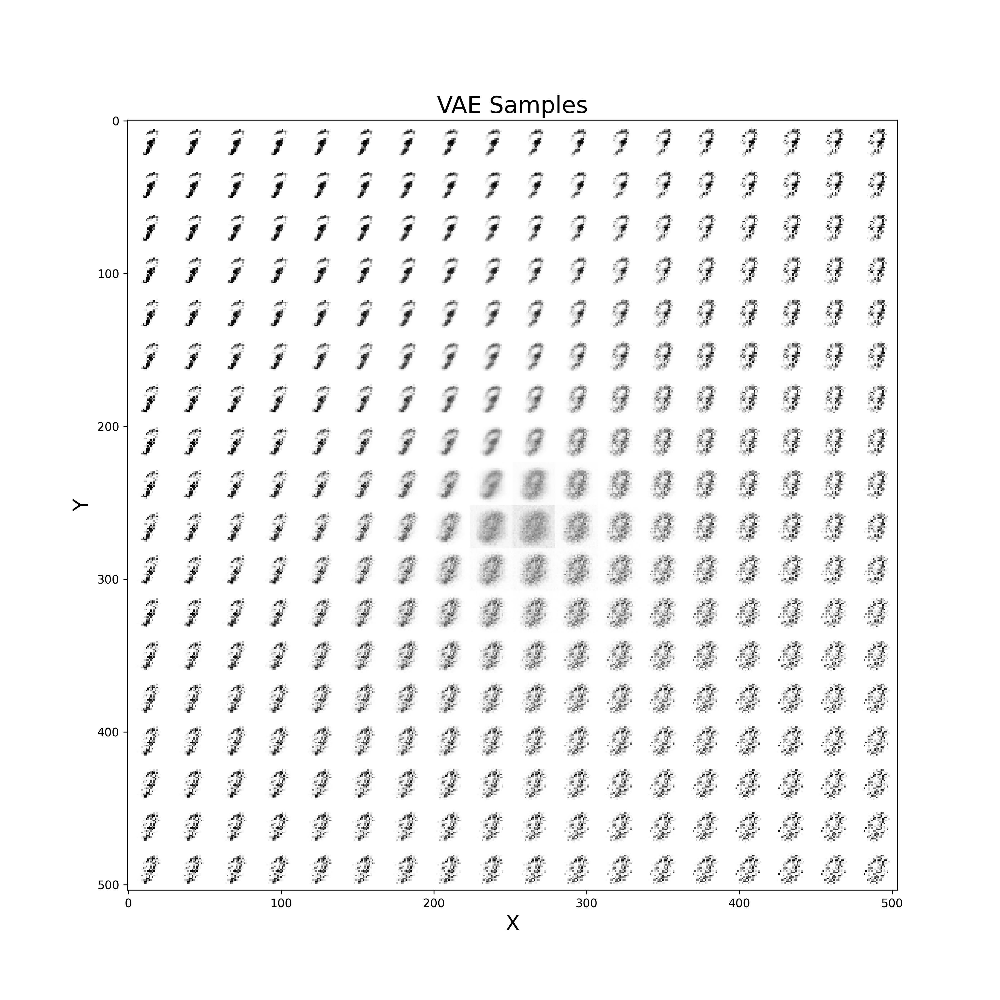

In [9]:
create_gif('animations/vae_samples')

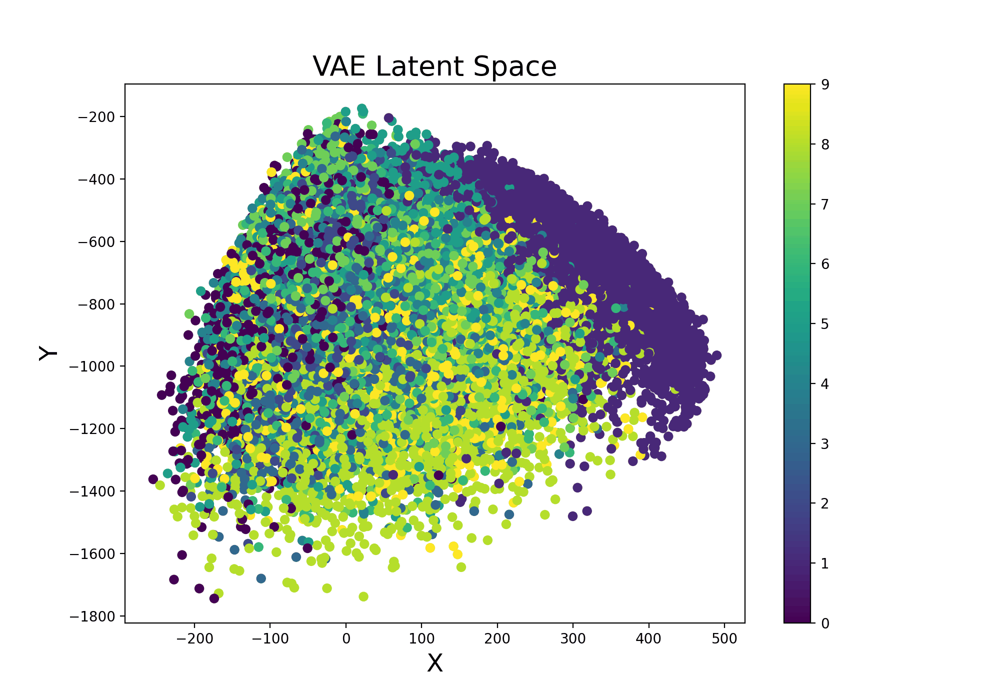

In [10]:
create_gif('animations/latent_space')